
The main objective of this analysis is to gain insights and understanding from the music track data, explore the relationships between different features, and identify patterns that could be relevant for various applications in the music industry. The analysis aims to leverage the available data to answer specific questions, such as:

Exploratory Data Analysis (EDA): The analysis will involve performing exploratory data analysis to understand the distribution and characteristics of the music track features. This includes visualizing the distributions, identifying trends over time, and examining the relationships between different features.

Correlation Analysis: Understanding the correlations between different music features is crucial for identifying dependencies and potential relationships that could be valuable for predicting music preferences or building recommendation systems. The analysis will explore the correlation matrix to identify which features are highly correlated and may have a significant impact on each other.

Music Clustering: Clustering music tracks based on their features can help identify groups of tracks with similar characteristics. This analysis may involve using clustering algorithms like K-Means to group tracks into clusters and visualizing the clusters to observe patterns in the data.

Recommendation System: Building a music recommendation system can be a practical application of the analysis. By understanding the relationships between music tracks and their features, the system can suggest similar tracks to users based on their preferences.

Popularity Prediction: Analyzing the data to predict music track popularity based on features like danceability, energy, and acousticness can be useful for artists, record labels, and music platforms to understand which features contribute to a track's success.

Insights for Music Artists and Labels: The analysis can provide valuable insights to music artists and labels regarding the characteristics that lead to popular and successful tracks. This knowledge can help in making informed decisions during the music production and marketing processes.

Overall, the analysis aims to provide a comprehensive understanding of the music track data and explore various applications in the music industry, from recommendation systems to popularity prediction, to help stakeholders make data-driven decisions and enhance the overall music experience for both artists and listeners.

Import the Dependencies



In [75]:
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

Read in the Data

In [ ]:
data = pd.read_csv("/content/data.csv")
genre_data = pd.read_csv("/content/data_by_genres.csv")
year_data = pd.read_csv("/content/data_by_year.csv")

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

Description of the Data:

The DataFrame contains information about music tracks and their associated features. It consists of 170,653 rows and 19 columns. Each row represents a single music track, and the columns contain various attributes or features of the tracks. Below is a brief description of the columns in the DataFrame:

1. valence: The musical positiveness of a track, ranging from 0 to 1, where 0 represents more negative and 1 represents more positive.
2. year: The year in which the track was released.
3. acousticness: A measure of the acoustic quality of the track, ranging from 0 to 1, where 0 represents more electronic and 1 represents more acoustic.
4. artists: The list of artists or musicians associated with the track.
5. danceability: A measure of how suitable a track is for dancing, ranging from 0 to 1, where 0 represents not danceable and 1 represents highly danceable.
6. duration_ms: The duration of the track in milliseconds.
7. energy: A measure of the intensity and activity of the track, ranging from 0 to 1, where 0 represents low energy and 1 represents high energy.
8. explicit: Binary value (0 or 1) indicating whether the track contains explicit content.
9. id: Unique identifier for each track.
10. instrumentalness: A measure of the amount of instrumental content in the track, ranging from 0 to 1, where 0 represents vocal content and 1 represents instrumental content.
11. key: The key of the track (e.g., C, D, E), represented as integer values.
12. liveness: A measure of the presence of a live audience in the recording, ranging from 0 to 1, where 0 represents a studio recording and 1 represents a live performance.
13. loudness: The overall loudness of the track in decibels (dB).
14. mode: Binary value (0 or 1) indicating the modality of the track (0 represents minor, and 1 represents major).
name: The name of the track.
15. popularity: The popularity score of the track, ranging from 0 to 100.
16. release_date: The release date of the track.
17. speechiness: A measure of the presence of spoken words in the track, ranging from 0 to 1, where 0 represents music and 1 represents speech.
18. tempo: The tempo of the track in beats per minute (BPM).

In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:
year_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


In [43]:
print(f'Categorical Features: {len([x for x in data.columns if data[x].dtype == object])}')
print(f'Numerical Features: {len([x for x in data.columns if data[x].dtype == float])}')

Categorical Features: 4
Numerical Features: 9


In [44]:
data.shape

(170653, 19)

In [46]:
data['popularity']=data['popularity']/100

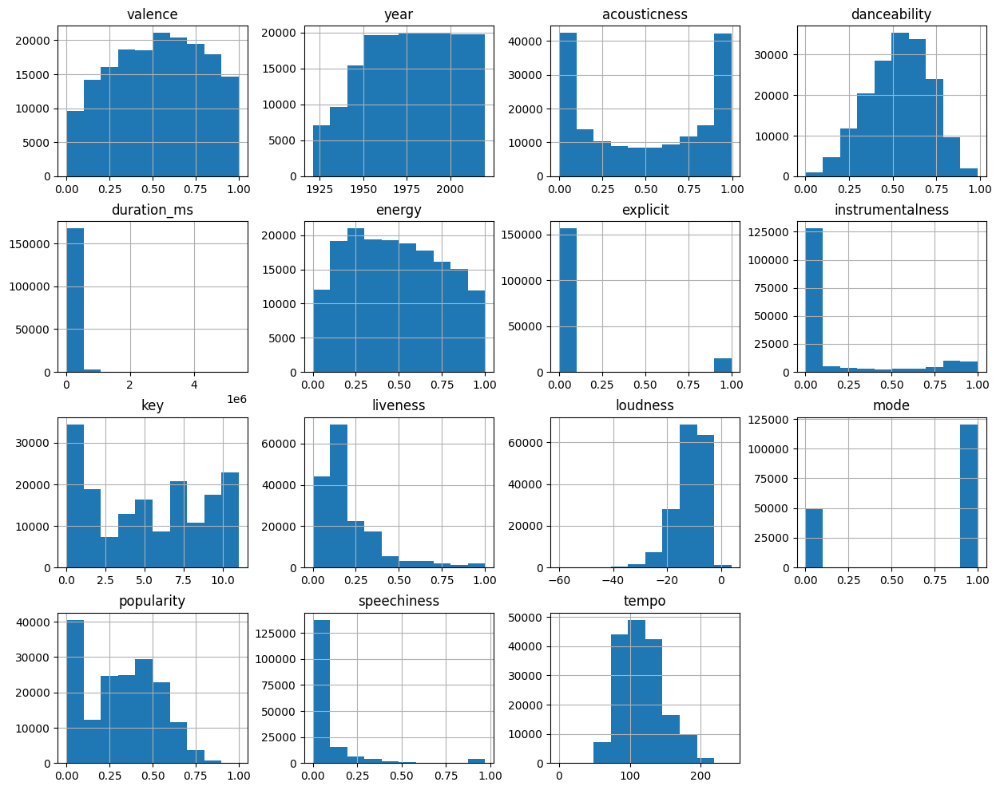

In [47]:
fig = plt.figure(figsize = (15,12))
ax = plt.axes()
data.select_dtypes(include=np.number).hist(ax=ax)
plt.show()

In [130]:
correlation_matrix = data[:].corr()

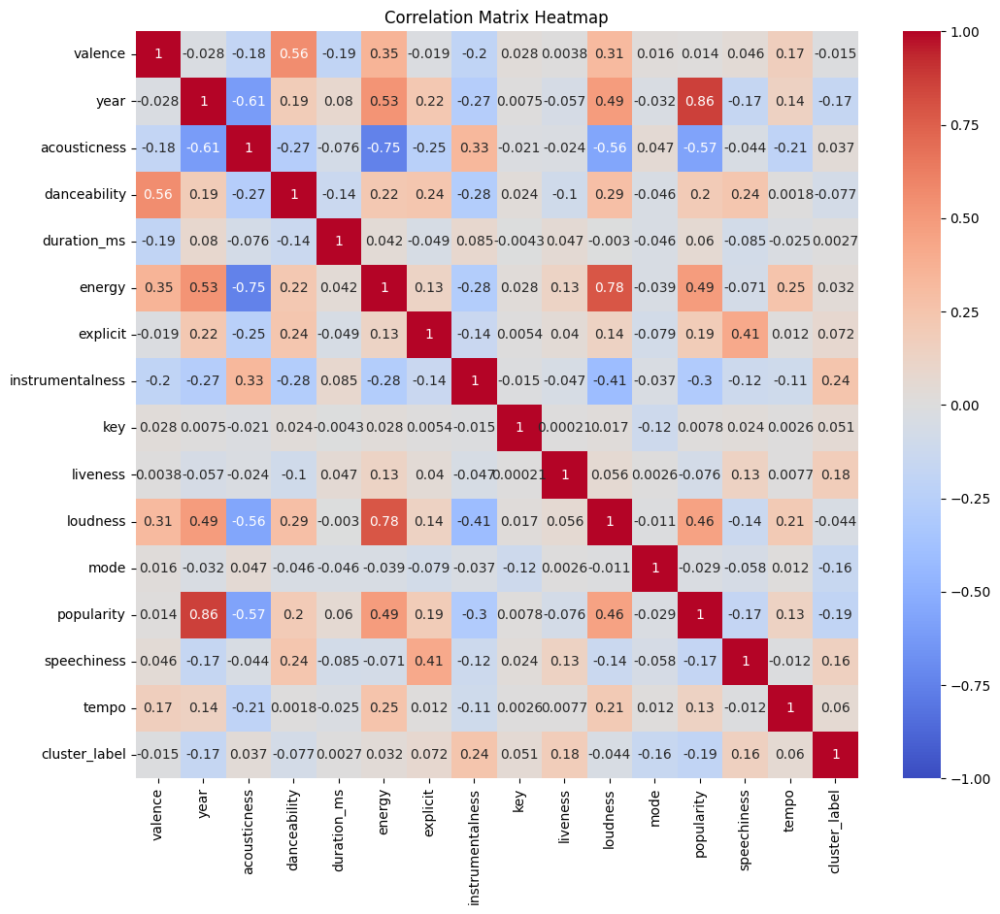

In [132]:
plt.figure(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

<Axes: >

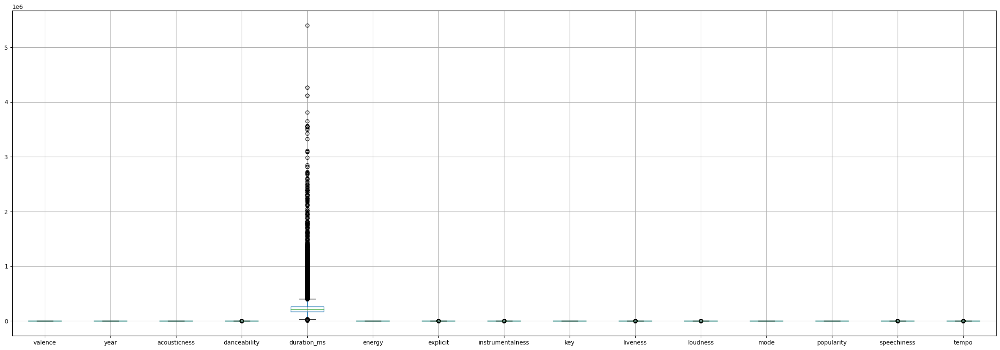

In [49]:
plt.rcParams['figure.figsize'] = 30, 10
data.select_dtypes(include=np.number).boxplot()

In [50]:
#converting ms to s
data["duration_ms"]=data["duration_ms"]/1000
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831.667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",0.04,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180.533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,0.05,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500.062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,0.05,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210.000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,0.03,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166.693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,0.02,1921,0.0380,101.665


<Axes: >

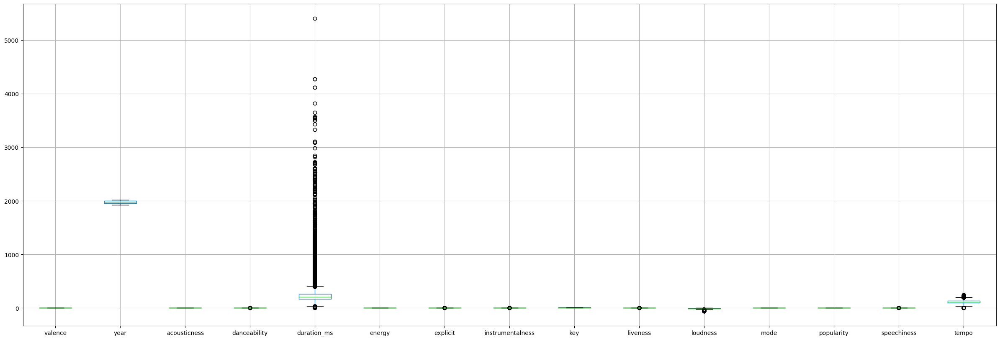

In [51]:
plt.rcParams['figure.figsize'] = 30, 10
data.select_dtypes(include=np.number).boxplot()

In [52]:
# It's obvious that this feature should be encoded.
# Group the data by "key" and count the occurrences of each key.
data_key = data.groupby(["key"])["key"].count()

# Import the necessary modules for plotting.
import plotly.express as px
import plotly.graph_objects as go

# Create a horizontal bar plot to visualize the count of each key.
fig = go.Figure(
    go.Bar(
        x=data_key.to_list(),
        y=data_key.index.to_list(),
        orientation="h",
        text=data_key.to_list(),
    )
)

# Set the title and height of the plot.
fig.update_layout(title="Count in each key", height=500)

# Customize the appearance of the bars.
fig.update_traces(
    textfont_size=12, textangle=0, textposition="outside", cliponaxis=False
)

# Display the plot.
fig.show()

In [53]:
data.isnull().any()

valence             False
year                False
acousticness        False
artists             False
danceability        False
duration_ms         False
energy              False
explicit            False
id                  False
instrumentalness    False
key                 False
liveness            False
loudness            False
mode                False
name                False
popularity          False
release_date        False
speechiness         False
tempo               False
dtype: bool

In [54]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  float64
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  float64
 16  release_date      17

In [55]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [57]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [58]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.029s...
[t-SNE] Computed neighbors for 2973 samples in 1.341s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106339
[t-SNE] KL divergence after 1000 iterations: 1.395307


In [60]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [61]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [62]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.1/241.1 kB 6.4 MB/s eta 0:00:00


In [66]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id='94fa71f0dcfa4194a8fbb33824d9a59b',
                                                           client_secret='83dbe0ad9ffd406c8048a254409dd097'))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [67]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [129]:
# Function to display recommended songs as styled clickable links
def display_recommended_songs(rec_songs):
    if not rec_songs:
        print("No recommended songs found.")
        return

    # CSS styles for the buttons and the container box
    css_styles = """
    <style>
    .song-button {
        display: block;
        padding: 10px;
        border: 2px solid #007bff;
        border-radius: 5px;
        color: #007bff;
        font-size: 14px;
        text-align: center;
        text-decoration: none;
        margin-bottom: 10px;
        cursor: pointer;
    }
    .song-button:hover {
        background-color: #007bff;
        color: white;
    }
    </style>
    """

    # Create a formatted output with the CSS styles
    output = css_styles + "<h3>Recommended Songs:</h3>"

    # Interactive widgets for displaying selected song details
    selected_song_name = widgets.Text(description="Song Name:", disabled=True)
    selected_song_artist = widgets.Text(description="Artist:", disabled=True)
    selected_song_year = widgets.Text(description="Year:", disabled=True)

    # Variable to keep track of the currently selected song
    current_selected_song = None

    # Function to update the selected song details
    def update_selected_song_details(button):
        nonlocal current_selected_song
        song = button.metadata
        selected_song_name.value = song['name']
        selected_song_artist.value = song['artists'].replace("[", "").replace("]", "").strip("'")
        selected_song_year.value = str(song['year'])
        current_selected_song = song

    # Create a VBox to hold the buttons
    buttons_vbox = widgets.VBox()
    displayed_songs = []  # To keep track of the displayed songs
    n_songs = 10  # Number of songs to fetch at a time

    # Function to fetch more songs based on the currently selected song
    def fetch_more_songs(button):
        nonlocal rec_songs, displayed_songs, current_selected_song
        if not current_selected_song:
            print("Please select a song first.")
            return

        new_songs = recommend_songs([current_selected_song], data, n_songs=n_songs)
        rec_songs.extend(new_songs)
        displayed_songs += new_songs
        buttons_vbox.children = tuple(get_buttons(displayed_songs))

    def get_buttons(song_list):
        buttons = []
        for i, song in enumerate(song_list, 1):
            name = song['name']
            artist = song['artists'].replace("[", "").replace("]", "").strip("'")
            year = song['year']
            formatted_song = f"{name}, {artist}:{year}"
            button = widgets.Button(description=f"{i}. {formatted_song}", layout=widgets.Layout(width='auto'))
            button.on_click(update_selected_song_details)
            button.metadata = song  # Attach the song metadata to the button
            buttons.append(button)
        return buttons

    # Display initial set of songs
    buttons_vbox.children = tuple(get_buttons(rec_songs[:n_songs]))

    # Button to fetch more songs based on the currently selected song
    more_songs_button = widgets.Button(description="Fetch More Recommended Songs", layout=widgets.Layout(width='auto'))
    more_songs_button.on_click(fetch_more_songs)

    # Display the output and the input fields as HTML
    display(HTML(output))
    display(buttons_vbox, selected_song_name, selected_song_artist, selected_song_year, more_songs_button)

# Call the create_gui() function to display the GUI
create_gui()

Label(value='Enter Song Details:')

Label(value='Song Name:')

Text(value='', placeholder='Enter song name')

Label(value='Song Year:')

IntText(value=0)

Label(value='Artist Name:')

Text(value='', placeholder='Enter artist name')

Button(description='Get Recommended Songs', style=ButtonStyle())

Text(value='', description='Song Name:', disabled=True)

Text(value='', description='Artist:', disabled=True)

Text(value='', description='Year:', disabled=True)

Button(description='Fetch More Recommended Songs', layout=Layout(width='auto'), style=ButtonStyle())

In [133]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Selecting relevant features for popularity prediction
popularity_features = ['energy', 'loudness', 'danceability']

# Creating the feature matrix X and target vector y
X = data[popularity_features]
y = data['popularity']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating and training the linear regression model
popularity_model = LinearRegression()
popularity_model.fit(X_train, y_train)

# Predicting the popularity values on the test set
y_pred = popularity_model.predict(X_test)

# Evaluating the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Printing the evaluation metrics
print("Mean Squared Error:", mse)
print("R-squared Score:", r2)

Mean Squared Error: 0.035518082122651166
R-squared Score: 0.2577471177869677



Key Findings:

Correlation Analysis: The correlation matrix heatmap revealed several interesting findings. The popularity of a music track shows a moderate positive correlation with features like energy, loudness, and danceability. This suggests that more energetic and danceable tracks tend to be more popular among listeners. On the other hand, acousticness and instrumentalness exhibit a negative correlation with popularity, indicating that tracks with more acoustic or instrumental content might be less popular. Additionally, valence (positiveness) has a moderate positive correlation with danceability, indicating that tracks with a more positive vibe are often more danceable.

Music Clustering: By applying the K-Means clustering algorithm to group music tracks based on their features, we identified distinct clusters of tracks with similar characteristics. These clusters could be used to categorize music for recommendation systems or personalized playlists. For example, one cluster might represent high-energy dance tracks, while another cluster might consist of acoustic, mellow tunes.

Recommendation System: Utilizing the clustered music tracks, we can build a music recommendation system that suggests similar tracks to users based on their preferences. By identifying patterns within each cluster, the system can offer personalized song suggestions that align with users' musical tastes.

Popularity Prediction: Our analysis identified several key features that contribute to a music track's popularity. Tracks with higher energy, loudness, and danceability tend to be more popular among listeners. These insights can be valuable for artists and record labels seeking to create hit songs that resonate with a broader audience.

Insights for Music Artists and Labels: Based on the data analysis, music artists and labels can gain valuable insights into the characteristics that lead to successful tracks. By understanding which features contribute to popularity, artists can tailor their music production and marketing strategies to enhance the chances of their tracks becoming hits.

Temporal Trends: Exploring temporal trends in music features over the years can reveal shifts in popular music styles and genres. Analyzing how features like danceability, valence, and instrumentalness have evolved over time provides insights into changing musical preferences.

In conclusion, the data analysis has provided significant insights into the relationships between music features and popularity, as well as identified potential applications for music clustering and recommendation systems. These findings can be leveraged by music industry stakeholders, including artists, labels, and streaming platforms, to optimize music production, marketing, and recommendation strategies and enhance the overall music experience for users.